## Capstone Project: Airbnb price recommender web application
------------------------------------------------------------------------------------------------------------------------
### Part 1. Data Cleaning

### Importing the libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import pickle

import geopandas as gpd
import folium

pd.pandas.set_option('display.max_columns', None)
pd.pandas.set_option('display.max_rows', None)

### Importing the datasets

In [3]:
# Read in the data
listings = pd.read_csv('../data/listings.csv.gz', compression = 'gzip', header = 0, sep = ',', quotechar = '"')

FileNotFoundError: [Errno 2] No such file or directory: '../data/listings.csv.gz'

### Data Cleaning

In [88]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4161 entries, 0 to 4160
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4161 non-null   int64  
 1   listing_url                                   4161 non-null   object 
 2   scrape_id                                     4161 non-null   int64  
 3   last_scraped                                  4161 non-null   object 
 4   source                                        4161 non-null   object 
 5   name                                          4161 non-null   object 
 6   description                                   4068 non-null   object 
 7   neighborhood_overview                         2636 non-null   object 
 8   picture_url                                   4161 non-null   object 
 9   host_id                                       4161 non-null   i

The dataset contains information on 4161 listings and 75 features of the Airbnb listings in Singapore. The data was retrieved from InsideAirbnb.com and last compiled on 22 September 2022.


In [89]:
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,50646,https://www.airbnb.com/rooms/50646,20220922191314,2022-09-23,previous scrape,Pleasant Room along Bukit Timah,Fully furnished bedroom with a nice view on th...,The serenity & quiet surrounding makes it an i...,https://a0.muscache.com/pictures/36342984/670d...,227796,https://www.airbnb.com/users/show/227796,Sujatha,2010-09-08,Singapore,"I am a working professional, living in Singapo...",a few days or more,0%,NaN,f,https://a0.muscache.com/im/pictures/user/8fd2c...,https://a0.muscache.com/im/pictures/user/8fd2c...,Bukit Timah,1,4,"['email', 'phone', 'work_email']",t,t,"Singapore, Singapore",Bukit Timah,Central Region,1.33432,103.78521,Private room in rental unit,Private room,2,NaN,1 bath,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""TV with standard...",$80.00,92,730,92.0,92.0,730.0,730.0,92.0,730.0,NaN,t,30,60,90,365,2022-09-23,18,0,0,2014-04-18,2014-12-26,4.56,4.72,4.78,4.78,4.94,4.72,4.50,NaN,f,1,0,1,0,0.18
1,71609,https://www.airbnb.com/rooms/71609,20220922191314,2022-09-22,city scrape,Ensuite Room (Room 1 & 2) near EXPO,For 3 rooms.Book room 1&2 and room 4<br /><br ...,NaN,https://a0.muscache.com/pictures/24453191/3580...,367042,https://www.airbnb.com/users/show/367042,Belinda,2011-01-29,Singapore,Hi My name is Belinda -Housekeeper \n\nI would...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/367042/profil...,https://a0.muscache.com/im/users/367042/profil...,Tampines,6,15,"['email', 'phone']",t,t,NaN,Tampines,East Region,1.34537,103.95887,Private room in villa,Private room,6,NaN,1 private bath,2.0,3.0,"[""Children\u2019s books and toys"", ""Iron"", ""Ke...",$145.00,92,1125,92.0,92.0,1125.0,1125.0,92.0,1125.0,NaN,t,5,35,65,340,2022-09-22,20,0,0,2011-12-19,2020-01-17,4.44,4.37,4.00,4.63,4.78,4.26,4.32,NaN,f,6,0,6,0,0.15
2,71896,https://www.airbnb.com/rooms/71896,20220922191314,2022-09-22,city scrape,B&B Room 1 near Airport & EXPO,<b>The space</b><br />Vocational Stay Deluxe B...,NaN,https://a0.muscache.com/pictures/2440674/ac4f4...,367042,https://www.airbnb.com/users/show/367042,Belinda,2011-01-29,Singapore,Hi My name is Belinda -Housekeeper \n\nI would...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/367042/profil...,https://a0.muscache.com/im/users/367042/profil...,Tampines,6,15,"['email', 'phone']",t,t,NaN,Tampines,East Region,1.34754,103.95958,Private room in home,Private room,1,NaN,Shared half-bath,1.0,1.0,"[""Paid parking on premises"", ""Keypad"", ""Fire p...",$85.00,92,1125,92.0,92.0,1125.0,1125.0,92.0,1125.0,NaN,t,0,1,1,265,2022-09-22,24,0,0,2011-07-30,2019-10-13,4.16,4.22,4.09,4.43,4.43,4.17,4.04,NaN,t,6,0,6,0,0.18
3,71903,https://www.airbnb.com/rooms/71903,20220922191314,2022-09-22,c

In [90]:
listings.shape

(4161, 75)

In [91]:
listings.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,4.161000e+03,4.161000e+03,4.161000e+03,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,0.0,3757.000000,4057.000000,4161.000000,4161.000000,4160.000000,4160.000000,4160.000000,4160.000000,4160.000000,4160.000000,0.0,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,2610.000000,2567.000000,2567.000000,2567.000000,2568.000000,2567.000000,2567.000000,4161.000000,4161.000000,4161.000000,4161.000000,2610.000000
mean,1.354784e+17,2.022092e+13,1.559857e+08,73.155011,118.058399,1.344527,103.815150,3.288873,NaN,1.461006,1.956372,57.566931,801.305936,57.137740,59.552644,907.970433,916.538942,59.319832,914.202067,NaN,16.328767,36.522711,58.079308,247.704158,13.999039,3.971641,0.511896,4.473590,4.599969,4.502139,4.685621,4.693384,4.701991,4.494714,40.652968,31.187455,8.931507,0.207883,1.000824
std,2.653249e+17,1.570501e+00,1.356249e+08,131.651559,203.491739,0.066965,0.065450,2.419709,NaN,0.778358,2.057320,65.746522,1598.917341,65.734692,76.289861,1671.851914,1669.750461,75.609024,1670.172352,NaN,12.475632,24.659918,36.052945,132.564024,35.696457,11.759577,1.670852,0.857918,0.637802,0.653106,0.583110,0.601927,0.499307,0.633892,61.386130,59.126819,19.581999,1.299147,1.593726
min,5.064600e+04,2.022092e+13,2.366600e+04,1.000000,1.000000,1.248260,103.635300,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.507292e+07,2.022092e+13,4.187059e+07,3.000000,5.000000,1.296100,103.769550,2.000000,NaN,1.000000,1.000000,1.000000,365.000000,1.000000,1.000000,365.000000,365.000000,1.000000,365.000000,NaN,0.000000,2.000000,18.000000,126.000000,0.000000,0.000000,0.000000,4.390000,4.500000,4.330000,4.650000,4.670000,4.630000,4.330000,3.000000,0.000000,0.000000,0.000000,0.080000
50%,3.990020e+07,2.022092e+13,1.367001e+08,13.000000,20.000000,1.313930,103.840400,2.000000,NaN,1.000000,1.000000,92.000000,1125.000000,92.000000,92.000000,1125.000000,1125.000000,92.000000,1125.000000,NaN,21.000000,50.000000,79.000000,322.000000,1.000000,0.000000,0.000000,4.730000,4.800000,4.690000,4.870000,4.900000,4.860000,4.670000,10.000000,2.000000,1.000000,0.000000,0.340000
75%,5.319607e+07,2.022092e+13,2.388916e+08,61.000000,109.000000,1.414620,103.855030,4.000000,NaN,2.000000,2.000000,92.000000,1125.000000,92.000000,92.000000,1125.000000,1125.000000,92.000000,1125.000000,NaN,29.000000,59.000000,89.000000,361.000000,10.000000,2.000000,0.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.910000,46.000000,21.000000,6.000000,0.000000,1.140000
max,7.208120e+17,2.022092e+13,4.804050e+08,503.000000,708.000000,1.488000,103.977662,16.000000,NaN,8.000000,46.000000,1000.000000,100000.000000,1000.000000,1000.000000,100000.000000,100000.000000,1000.000000,100000.000000,NaN,30.000000,60.000000,90.000000,365.000000,413.000000,230.000000,35.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,217.000000,199.000000,95.000000,14.000000,15.260000


In [92]:
# Convert price to numeric
listings['price'] = listings['price'].str.replace(',', '')
listings['price'] = listings['price'].str.replace('$', '')
listings['price'] = listings['price'].astype(float)

<ipython-input-92-ae974dcc460a>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listings['price'] = listings['price'].str.replace('$', '')


In [93]:
listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

### Drop initial columns

The listing features consists of the following categories
- Name and description of listing
- Host detail (name, location, response time, total listings, superhost)
- Neighbourhood (Neighbourhood, Neighbourhood group, latitude, longitude)
- Property and prices (Property type, room type, no. of guests, beds, bathrooms, amenities, instant booking, Price, minimal night, maximum night ...)
- Availiability (calendar, 30,60, 90, 365 days availability)
- Reviews (No. of reviews, review scores)
- Calculated values (Host's listings for entire homes and private rooms, reviews per month)

#### Name and description of listing

The following columns are related to the name and description of the listing

#### Listing descriptions

In [94]:
listings_description = ['id','listing_url','scrape_id', 'last_scraped', 'name', 'description','neighborhood_overview', 'picture_url']

We will keep the following description columns, the rest of the columns are not useful for price prediction

In [95]:
listings_description = ['id','name','description']

#### Host Details

In [96]:
host_details = ['host_id', 'host_url','host_name', 'host_since', 'host_location', 'host_about','host_response_time', 'host_response_rate', 'host_acceptance_rate',
                'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count',
                'host_verifications', 'host_has_profile_pic', 'host_identity_verified']

We will keep the following columns  as these might affect the price of the Airbnb listing

In [97]:
host_details = ['host_id','host_name','host_response_time', 'host_response_rate', 'host_acceptance_rate','host_is_superhost', 'host_has_profile_pic', 'host_identity_verified' ]

#### Neighbourhood

In [98]:
neighbourhood_details = ['neighbourhood','neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude','longitude']

We will keep the columns as they are essential for our analysis.

#### Property Details

In [99]:
property_details = ['property_type', 'room_type', 'accommodates', 'bathrooms','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'instant_bookable',
                    'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
                    'maximum_maximum_nights', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm']

As we are not interested in the pricing based on the calendar data, we will drop the columns related to the calendar data.

In [100]:
property_details = ['property_type', 'room_type', 'accommodates', 'bathrooms','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'instant_bookable','price']

#### Calendar availability

In [101]:
calendar_available = ['availability_30', 'availability_60', 'availability_90','availability_365', 'calendar_last_scraped']

For our analysis, we will use the following columns:

In [102]:
calendar_available = ['availability_30', 'availability_60', 'availability_90','availability_365']

#### Review details

In [103]:
reviews = ['number_of_reviews', 'number_of_reviews_ltm', 'first_review','last_review', 'review_scores_rating', 'review_scores_accuracy',
           'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
           'review_scores_value', 'license', 'reviews_per_month']

We will concentrate on the following columns

In [104]:
reviews = ['number_of_reviews','reviews_per_month', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

#### Calculated values

In [105]:
calculated_details = ['calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms']

### Impute missing values

In [106]:
features = listings_description + host_details + neighbourhood_details + calendar_available + property_details + reviews + calculated_details

In [107]:
# Create a new dataframe with the features
listings = listings[features]

In [108]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4161 entries, 0 to 4160
Data columns (total 42 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4161 non-null   int64  
 1   name                                          4161 non-null   object 
 2   description                                   4068 non-null   object 
 3   host_id                                       4161 non-null   int64  
 4   host_name                                     4161 non-null   object 
 5   host_response_time                            3471 non-null   object 
 6   host_response_rate                            3471 non-null   object 
 7   host_acceptance_rate                          3590 non-null   object 
 8   host_is_superhost                             4160 non-null   object 
 9   host_has_profile_pic                          4161 non-null   o

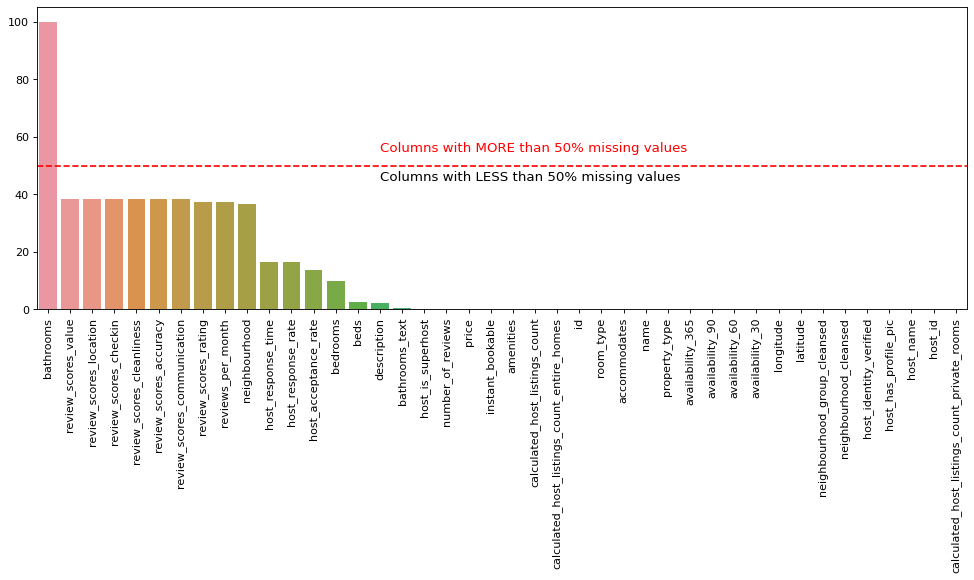

In [109]:
# Plot the bar chart of the missing values

percent_missing = listings.isnull().sum() * 100 / len(listings)
missing_value_df = pd.DataFrame({'column_name': listings.columns,
                                'percent_missing': percent_missing})

plt.figure(figsize = (15,5), dpi = 80)
plt.xticks(rotation = 90)
#Draw horizontal line at 50%
plt.axhline(50, color = 'red', linestyle = '--')
plt.text(15, 55, 'Columns with MORE than 50% missing values', color = 'red', fontsize = 12)
plt.text(15,45, 'Columns with LESS than 50% missing values', color = 'black', fontsize = 12)
sns.barplot(data = missing_value_df, x = listings.columns, y = percent_missing,
            order = missing_value_df.sort_values('percent_missing', ascending = False).column_name);

In [110]:
listings.isnull().sum().sort_values(ascending = False)

bathrooms                                       4161
review_scores_value                             1594
review_scores_location                          1594
review_scores_checkin                           1594
review_scores_cleanliness                       1594
review_scores_accuracy                          1594
review_scores_communication                     1593
review_scores_rating                            1551
reviews_per_month                               1551
neighbourhood                                   1525
host_response_time                               690
host_response_rate                               690
host_acceptance_rate                             571
bedrooms                                         404
beds                                             104
description                                       93
bathrooms_text                                    24
host_is_superhost                                  1
number_of_reviews                             

In [111]:
listings.columns

Index(['id', 'name', 'description', 'host_id', 'host_name',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities',
       'instant_bookable', 'price', 'number_of_reviews', 'reviews_per_month',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms'],
      dtype='object')

#### Reviews

For the reviews section, we will impute the missing values with 0 as the missing values are due to the absence of reviews.
We will also impute 0 for the listings with no reviews_per_month

In [112]:
# We will replace the null values with 0 due to absence of reviews
listings['review_scores_rating'].fillna(0, inplace = True)
listings['review_scores_cleanliness'].fillna(0, inplace = True)
listings['review_scores_value'].fillna(0, inplace = True)
listings['review_scores_location'].fillna(0, inplace = True)
listings['review_scores_checkin'].fillna(0, inplace = True)
listings['review_scores_accuracy'].fillna(0, inplace = True)
listings['review_scores_communication'].fillna(0, inplace = True)

In [113]:
listings[listings['reviews_per_month'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
14,481789,Master Bedroom in Newly Built Flat,Aircon Master Bedroom in a Newly Built Flat fo...,2386154,Susan,NaN,NaN,NaN,f,t,f,"Singapore, Singapore",Tampines,East Region,1.34816,103.93238,0,0,0,0,Private room in rental unit,Private room,2,NaN,1 bath,1.0,1.0,"[""Washer"", ""Kitchen"", ""Air conditioning"", ""TV""...",f,37.0,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1
16,642660,BEST CITY LIVING WITH GA RESIDENCE,<b>The space</b><br />LEADING PROVIDER OF PREM...,3212572,Roger,NaN,NaN,NaN,f,t,f,NaN,Rochor,Central Region,1.30096,103.85206,30,60,90,365,Private room in rental unit,Private room,2,NaN,2 baths,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""Pool"", ""Air cond...",f,170.0,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1
18,733863,Homestay at Serangoon,Theme Park with jogging track and workout corn...,3824517,Shirlnet,a few days or more,0%,NaN,f,t,f,NaN,Serangoon,North-East Region,1.36926,103.87312,30,60,90,365,Private room in rental unit,Private room,1,NaN,1 bath,1.0,1.0,"[""Iron"", ""Washer"", ""Kitchen"", ""Elevator"", ""Loc...",f,26.0,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1
26,823571,Apartment away from town,<b>The space</b><br />Single bedroom with shar...,4177147,Tania,NaN,NaN,NaN,f,t,t,NaN,Bedok,East Region,1.31313,103.91479,0,0,0,0,Private room in rental unit,Private room,1,NaN,NaN,1.0,1.0,"[""Air conditioning"", ""TV"", ""Long term stays al...",f,284.0,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1
39,1562453,Deluxe Quad-sharing room,"A huge, spacious quad-sharing common bedroom. ...",8270362,Domus,NaN,NaN,NaN,f,t,f,"Singapore, Singapore",Novena,Central Region,1.32359,103.84980,0,0,0,0,Private room in home,Private room,4,NaN,1 bath,1.0,4.0,"[""Wifi"", ""Washer"", ""Air conditioning"", ""Long t...",f,30.0,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1


In [114]:
# For listings with no reviews_per_month, we will replace the missing values with 0
listings['reviews_per_month'].fillna(0, inplace = True)

In [115]:
listings.isnull().sum().sort_values(ascending = False)

bathrooms                                       4161
neighbourhood                                   1525
host_response_time                               690
host_response_rate                               690
host_acceptance_rate                             571
bedrooms                                         404
beds                                             104
description                                       93
bathrooms_text                                    24
host_is_superhost                                  1
review_scores_rating                               0
amenities                                          0
instant_bookable                                   0
price                                              0
number_of_reviews                                  0
reviews_per_month                                  0
id                                                 0
review_scores_accuracy                             0
review_scores_cleanliness                     

#### Host details

We will investigate the missing values for the host details

##### Host Response Time

In [116]:
listings['host_response_time'].value_counts()

within an hour        1757
within a few hours     994
within a day           435
a few days or more     285
Name: host_response_time, dtype: int64

In [117]:
listings['host_response_time'].isnull().sum()

690

As there are missing values for the host response time and we are not particularly sure if the host of the listings are active, we will impute the missing value with 'unknown'

In [118]:
listings['host_response_time'].fillna('unknown', inplace = True)

In [119]:
listings['host_response_time'].value_counts()

within an hour        1757
within a few hours     994
unknown                690
within a day           435
a few days or more     285
Name: host_response_time, dtype: int64

##### Host Response Rate #####

As the host_response_rate and host_acceptance_rate columns are in percentage, we will categorise the percentage into 4 different categories (0-49%, 50-69%, 70-89%, 90-100%). \
For the missing values, we will impute the missing values with 'unknown'

In [120]:
listings.isnull().sum().sort_values(ascending = False).head()

bathrooms               4161
neighbourhood           1525
host_response_rate       690
host_acceptance_rate     571
bedrooms                 404
dtype: int64

In [121]:
listings['host_response_rate'].value_counts()

100%    1704
91%      249
90%      219
95%      203
0%       198
97%      153
99%      145
80%       94
98%       88
34%       49
94%       45
92%       43
93%       39
96%       39
50%       32
88%       19
70%       18
57%       17
75%       17
67%       12
89%       11
33%       10
78%        9
25%        8
60%        7
73%        7
30%        6
58%        5
13%        5
51%        4
37%        3
84%        3
44%        2
40%        2
86%        1
87%        1
71%        1
83%        1
10%        1
17%        1
Name: host_response_rate, dtype: int64

We will convert the host_response_rate and host_acceptance_rate to numeric

In [122]:
# Remove the % sign from the values
listings['host_response_rate'] = listings['host_response_rate'].str.replace('%', '')
# Convert the column to float
listings['host_response_rate'] = listings['host_response_rate'].astype(float)

In [123]:
# Replace values with bins
listings['host_response_rate'] = pd.cut(listings['host_response_rate'], bins = [0, 50, 70, 90, 100], labels = ['0-49%', '50-69%', '70-89%', '90-100%'], include_lowest = True)
# Convert the column to string
listings['host_response_rate'] = listings['host_response_rate'].astype(str)
# Replace nan with unknown
listings['host_response_rate'].replace('nan', 'unknown', inplace = True)

In [124]:
listings['host_response_rate'].value_counts()

90-100%    2708
unknown     690
70-89%      383
0-49%       317
50-69%       63
Name: host_response_rate, dtype: int64

##### Host Acceptance Rate #####

We will do the same for the host acceptance rate.

In [125]:
# Remove the % sign from the values
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.replace('%', '')
# Convert the column to float
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype(float)

In [126]:
# Replace values with bins
listings['host_acceptance_rate'] = pd.cut(listings['host_acceptance_rate'], bins = [0, 50, 70, 90, 100], labels = ['0-49%', '50-69%', '70-89%', '90-100%'], include_lowest = True)
# Convert the column to string
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype(str)
# Replace nan with unknown
listings['host_acceptance_rate'].replace('nan', 'unknown', inplace = True)

In [127]:
listings['host_acceptance_rate'].value_counts()

90-100%    1879
0-49%      1026
unknown     571
70-89%      541
50-69%      144
Name: host_acceptance_rate, dtype: int64

#### Bedrooms and beds

As for the missing values for Bedrooms and Beds, we will replace the null values with the median no. of bedrooms for the respective accommodation capacity.

In [128]:
# No. of null values for bedrooms
listings['bedrooms'].isnull().sum()

404

In [129]:
listings[listings['bedrooms'].isnull()].head(3)

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
8,330089,Cozy Blue Single Room,A unit for all foreign students in a homestay ...,1439258,Kay,within an hour,90-100%,70-89%,f,t,t,NaN,Bukit Merah,Central Region,1.28652,103.81225,29,33,57,332,Private room in rental unit,Private room,1,NaN,2 shared baths,NaN,1.0,"[""Hot water"", ""Washer"", ""Kitchen"", ""Smart lock...",f,55.0,12,0.11,4.73,4.55,4.55,4.91,4.82,4.45,4.45,44,2,42
90,4486217,Sub-urban Singapore Resort Living,"Beautiful studio unit with loft, kitchen & was...",23276884,Faith,unknown,unknown,0-49%,f,t,f,"Singapore, Singapore",Serangoon,North-East Region,1.38763,103.86942,28,58,88,88,Entire rental unit,Entire home/apt,2,NaN,1 bath,NaN,2.0,"[""Stove"", ""Gym"", ""Washer"", ""Kitchen"", ""Oven"", ...",f,106.0,9,0.09,4.22,4.67,4.89,4.89,5.00,4.00,4.11,1,1,0
91,4499317,Heritage Collection on Seah Premium Loft,"Centrally located in City Hall, this apartment...",23336011,Heritage,within an hour,90-100%,70-89%,t,t,t,"Singapore, Singapore",Downtown Core,Central Region,1.29489,103.85401,9,36,66,339,Room in aparthotel,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Iron"", ""Air conditioning"", ""Smoke alarm"", ""H...",t,261.0,150,1.57,4.79,4.80,4.79,4.83,4.87,4.90,4.70,51,51,0


In [35]:
# For Bedrooms, we will replace null values with the median no. of bedrooms for accomodation capacity of each listing
listings['bedrooms'].fillna(listings.groupby('accommodates')['bedrooms'].transform('median'), inplace = True)

# For Beds, we will replace null values with the median no. of beds for accomodation capacity of each listing
listings['beds'].fillna(listings.groupby('accommodates')['beds'].transform('median'), inplace = True)

In [36]:
# Let us check the null values for the bedrooms column to ensure that we have replaced the null values

In [37]:
listings[listings['bedrooms'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
2802,47790035,lyf Funan Singapore by Ascott | co-living space,NaN,385189116,Jay Vincent,within an hour,100%,95%,NaN,t,t,NaN,Museum,Central Region,1.292607,103.848885,0,0,0,0,Room in boutique hotel,Hotel room,0,NaN,NaN,NaN,NaN,"[""Pocket wifi"", ""Iron"", ""Dishwasher"", ""Limited...",f,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0


In [38]:
# We will remove this particular listing by its ID as it has no bedrooms and no beds and no pricing
listings = listings[listings['id'] != 47790035]

In [39]:
listings[listings['bedrooms'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms


#### Bathroom (Quantity and Type)

As the values for 'bathrooms' is empty for all rows. We will
1) Drop the columns and replaced it with 'bathrooms_text and rename 'bathrooms_text' to 'bathrooms'
2) Split the new 'bathrooms' column to 'bathroom_qty' and 'bathroom_type'

In [40]:
listings['bathrooms'].isnull().sum()

4160

In [41]:
# Drop 'bathrooms' column as it has too many missing values
listings.drop('bathrooms', axis = 1, inplace = True)

# Rename bathroom_text to bathrooms
listings.rename(columns = {'bathrooms_text':'bathrooms'}, inplace = True)

In [42]:
listings['bathrooms'].value_counts()

1 bath               1463
2 baths               753
1 private bath        629
1 shared bath         358
1.5 baths             150
3 shared baths        140
3 baths               138
2 shared baths        116
1.5 shared baths       68
2.5 baths              45
4 shared baths         32
4 baths                30
5 shared baths         25
0 shared baths         23
3.5 baths              19
Shared half-bath       18
0 baths                18
2.5 shared baths       16
6 baths                13
7 shared baths         11
8 baths                11
5 baths                 9
6 shared baths          8
Private half-bath       7
8.5 shared baths        4
5.5 baths               3
4.5 baths               3
3.5 shared baths        3
8 shared baths          3
10 baths                3
16 shared baths         2
16 baths                2
10 shared baths         2
13 baths                2
21 shared baths         2
Half-bath               2
4.5 shared baths        2
7.5 shared baths        1
8.5 baths   

In [43]:
listings['bathrooms'].isnull().sum()    

23

In [44]:
# Fill the missing values with '1 baths'
listings['bathrooms'].fillna('1 baths', inplace = True)

In [45]:
# Split the new 'bathrooms' column to 'bathroom_qty' and 'bathroom_type'

listings['bathroom_qty'] = listings['bathrooms'].str.split(' ').str[0]
listings['bathroom_type'] = listings['bathrooms'].str.split(' ').str[1]

##### Bathroom Quantity

In [46]:
# We can drop bathrooms column now
listings.drop('bathrooms', axis = 1, inplace = True)

In [47]:
listings['bathroom_qty'].value_counts()

1            2450
2             869
3             278
1.5           218
0              64
4              62
2.5            61
5              34
3.5            22
6              21
Shared         18
8              14
7              11
Private         7
10              5
8.5             5
4.5             5
16              4
5.5             4
13              3
Half-bath       2
21              2
7.5             1
Name: bathroom_qty, dtype: int64

As we want to keep the Bathroom Qty column as numeric, we will drop the listings with Shared,Private Bathroom Qty

In [48]:
# We will drop the listings with Shared,Private bathroom_qty, Half-bath as we want to keep the feature as numeric
listings = listings[listings['bathroom_qty'] != 'Shared']
listings = listings[listings['bathroom_qty'] != 'Private']
listings = listings[listings['bathroom_qty'] != 'Half-bath']

In [49]:
listings[listings['bathroom_qty'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,bathroom_qty,bathroom_type


In [ ]:
# We will check out the no. of bathrooms for the listings
listings['bathroom_qty'].value_counts()

1      1857
2       452
3       190
1.5     164
0        58
4        42
5        32
2.5      30
6        19
8        12
7        11
3.5      11
10        5
8.5       5
16        4
13        3
21        2
4.5       2
7.5       1
5.5       1
Name: bathroom_qty, dtype: int64

There is a presence of half bathroom, we will round it off to the nearest integer

In [132]:
# Round off the bathroom_qty to the nearest integer
listings['bathroom_qty'] = listings['bathroom_qty'].astype(float)
listings['bathroom_qty'] = listings['bathroom_qty'].round(0)

In [133]:
listings['bathroom_qty'].value_counts()

1.0     1857
2.0      646
3.0      190
0.0       58
4.0       55
5.0       32
6.0       20
8.0       18
7.0       11
10.0       5
16.0       4
13.0       3
21.0       2
Name: bathroom_qty, dtype: int64

##### Bathroom Type

In [50]:
listings['bathroom_type'].value_counts()

bath       1463
baths      1223
shared      818
private     629
Name: bathroom_type, dtype: int64

In [51]:
# We will change the name from bath to baths for consistency
listings.replace('bath', 'baths', inplace = True)

In [52]:
listings['bathroom_type'].value_counts()

baths      2686
shared      818
private     629
Name: bathroom_type, dtype: int64

In [55]:
listings.isnull().sum().sort_values(ascending = False)

neighbourhood                                   1515
host_response_time                               683
host_response_rate                               683
host_acceptance_rate                             564
description                                       90
review_scores_checkin                              0
instant_bookable                                   0
price                                              0
number_of_reviews                                  0
reviews_per_month                                  0
review_scores_rating                               0
review_scores_accuracy                             0
review_scores_cleanliness                          0
id                                                 0
review_scores_communication                        0
review_scores_location                             0
beds                                               0
review_scores_value                                0
calculated_host_listings_count                

#### Description of listing

There are listings that do not have a description. \
We will fill in the null value with '' for the listings description

In [69]:
listings.isnull().sum().sort_values(ascending = False).head()

neighbourhood                1515
description                    90
review_scores_cleanliness       0
beds                            0
amenities                       0
dtype: int64

In [70]:
listings['description'].fillna(value = '', inplace = True)

In [71]:
listings.isnull().sum().sort_values(ascending = False).head()

neighbourhood       1515
id                     0
beds                   0
amenities              0
instant_bookable       0
dtype: int64

Now we are left with the missing values in neighbourhood column, we will tackle that later in the notebook

### Exploratory Data Analysis
Now that we have ensured that there are no more missing values in the data, we can perform some exploratory data analysis

#### Listings location

In [133]:
listings.groupby('neighbourhood')['id'].count().sort_values(ascending = False)

neighbourhood
Singapore, Singapore                       1900
Johor Bahru, Johor, Malaysia                386
Nusajaya, Johor, Malaysia                   130
Tanjong Pagar, Singapore                     20
Johor Bahru, Malaysia                        19
Jurong East, Singapore                       15
Novena , Singapore                           13
Bugis, Singapore                             13
Farrer Park, Singapore                        9
Little India, Singapore                       8
n/a, Singapore                                8
Iskandar Puteri, Johor, Malaysia              7
Katong, Singapore                             7
Potong Pasir, Singapore                       5
Singapore, *, Singapore                       5
Singapore                                     5
Masai, Johor, Malaysia                        5
Chinatown, Singapore                          5
Dhoby Ghaut, Singapore                        4
Novena /Toa Payoh, Singapore                  4
Orchard , Singapore       

It seems that there are listings from Johor Bahru mixed in together in this dataset.

Let us view the location of the AirBNB listing on the Plotly Express interactive Map

In [135]:
import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_group_cleansed','price'], zoom=10)

fig.update_layout(title = 'Airbnb Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

From the map, we can see that some Airbnb listings located in Johor Bahru are included in the dataset. Generally, Airbnb listings price in Malaysia are lower therefore we have to remove them.

We will identify these Airbnb from the Neighbourhood column

In [73]:
# Missing values in 'Neighbourhood' column
listings['neighbourhood'].isnull().sum()

1515

In [74]:
# Replace missing values with ''
listings['neighbourhood'] = listings['neighbourhood'].replace(np.nan, 'Unknown', regex=True)
#listings['neighbourhood'].fillna(np.nan, inplace = True)

In [75]:
listings['neighbourhood'].value_counts()

Singapore, Singapore                       1900
                                           1515
Johor Bahru, Johor, Malaysia                386
Nusajaya, Johor, Malaysia                   130
Tanjong Pagar, Singapore                     20
Johor Bahru, Malaysia                        19
Jurong East, Singapore                       15
Bugis, Singapore                             13
Novena , Singapore                           13
Farrer Park, Singapore                        9
n/a, Singapore                                8
Little India, Singapore                       8
Iskandar Puteri, Johor, Malaysia              7
Katong, Singapore                             7
Singapore, *, Singapore                       5
Potong Pasir, Singapore                       5
Singapore                                     5
Masai, Johor, Malaysia                        5
Chinatown, Singapore                          5
Johor, Malaysia                               4
Tiong Bahru/Outram Park, Singapore      

We will remove the listings from Johor Bahru by filtering the listings with 'Johor Bahru' in the Neighbourhood column \
After removal, there are still some Johor Bahru listings, we will remove them according to the latitude and longitude of the listings

In [76]:
listings = listings[~listings['neighbourhood'].str.contains('Johor')]

In [77]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'AirBNB Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

In [78]:
# Remove by Latitude
listings = listings[listings['latitude'] < 1.455]

In [79]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'Airbnb Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

There are still JB listings towards North West of Singapore
1) Remove them based on Latitude and Longitude
2) Will also remove 2 Singapore listings, however they seem to be wrongly labelled as the listing does not match the location

In [80]:
listings = listings[listings['longitude'] > 103.67]

In [81]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'AirBNB Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

There is another column called Neighbourhood cleansed which is a more refined version of Neighbourhood. \
Let us use this column to plot the listings.

<AxesSubplot:xlabel='count', ylabel='neighbourhood_cleansed'>

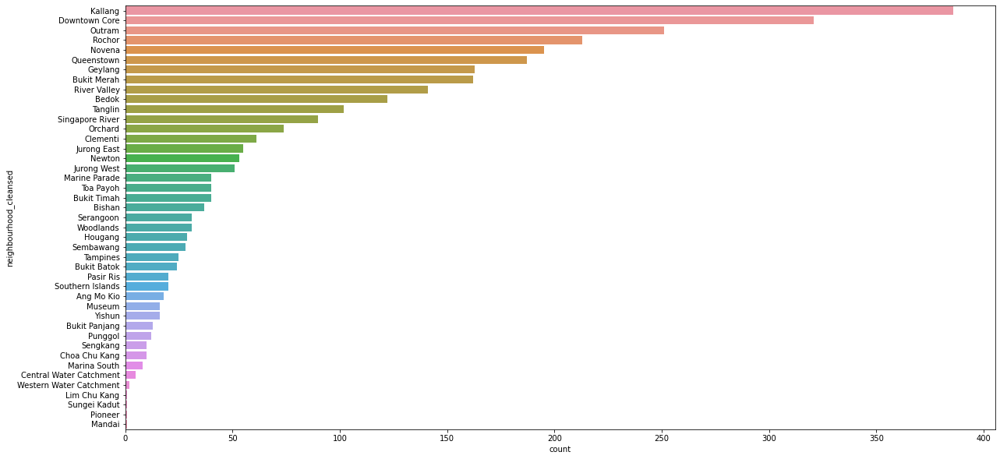

In [82]:
# PLot no. of neighbourhood to see which is the most popular
plt.figure(figsize=(20, 10))
sns.countplot(y = 'neighbourhood_cleansed', data = listings, order = listings['neighbourhood_cleansed'].value_counts().index)

We will then replace the Neighbourhood column with the cleansed version

In [83]:
# Drop the neighbourhood column as we will be using neighbourhood_cleansed instead
listings.drop('neighbourhood', axis = 1, inplace = True)
listings.rename(columns = {'neighbourhood_cleansed': 'neighbourhood'}, inplace = True)

In [84]:
listings.shape

(3106, 41)

#### Price

To investigate the price distribution, we will plot the price distribution using a histogram

<AxesSubplot:xlabel='price', ylabel='Count'>

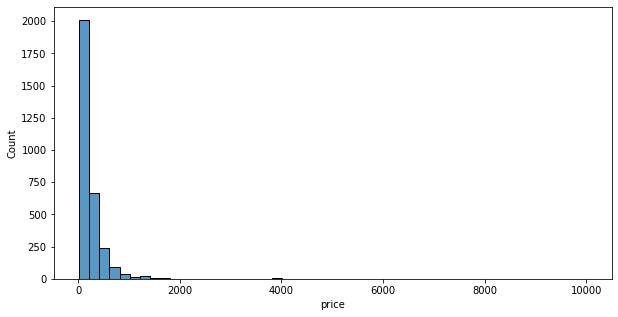

In [85]:
# Let us take a look at the distribution of the price
plt.figure(figsize=(10, 5))
sns.histplot(data = listings, x = 'price', bins = 50)

The distribution of the price is right skewed. We shall plot the price with a box plot to identify the outliers.

c:\Users\edmun\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



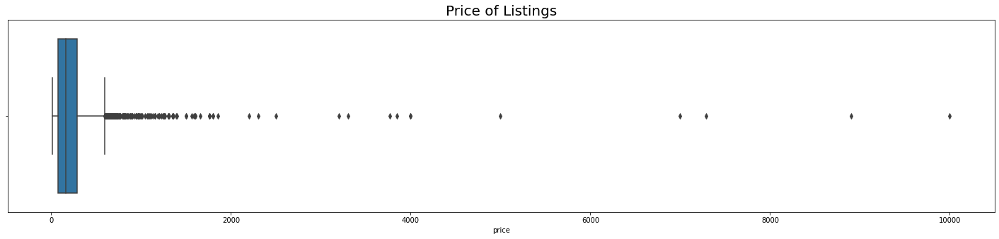

In [86]:
# Plot a boxplot to observice the prices of the listings
plt.figure(figsize=(25, 5))
sns.boxplot(listings['price'])
plt.title('Price of Listings', fontsize = 20);

In [87]:
listings['price'].describe()

count    3106.000000
mean      245.534449
std       413.658693
min        13.000000
25%        79.000000
50%       161.000000
75%       284.000000
max      9999.000000
Name: price, dtype: float64

It can be seen that the listing price ranges from $13 to $9999 with extremely high outliers. As these prices are advertised by the homeowners, these prices might not be realistic and not the actual price that the Airbnb users will be paying when they stay in the listing. 

Hence, we will be removing these outliers which will affect the final model performance based on the Interquartile range (IQR) method.

In [88]:
Q1 = listings['price'].quantile(0.25)
Q3 = listings['price'].quantile(0.75)
IQR = Q3 - Q1
outlier_price = Q3 + 1.5 * IQR
print(f"Listings that are above ${outlier_price} are outliers and will be removed")

Listings that are above $591.5 are outliers and will be removed


In [89]:
# Remove outliers
listings = listings[listings['price'] < outlier_price]
# Reset the index
listings.reset_index(drop = True, inplace = True)

In [90]:
listings.shape

(2901, 41)

<AxesSubplot:xlabel='price', ylabel='Count'>

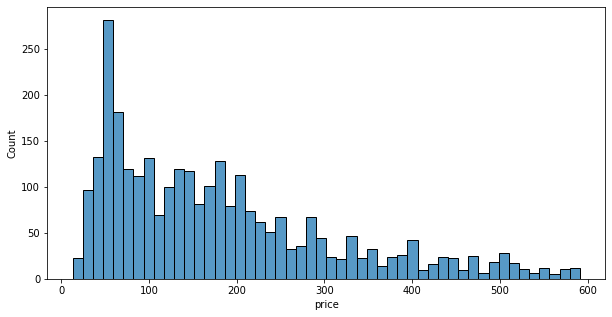

In [91]:
# Let us take a look at the distribution of the price
plt.figure(figsize=(10, 5))
sns.histplot(data = listings, x = 'price', bins = 50)

As the price distribution is still highly skewed. We will perform log transformation of the target variable during the Modelling phase to normalize the target variable.

#### Host details

Let us explore how certain details about the hosts will affect the price of the listings

##### Whether Host is Superhost

For Airbnb, users tend to prefer to stay in a listing that is hosted by a superhost. Hence, we will investigate the relationship between the host type and the price of the listing.

In [92]:
listings.groupby(
    ["host_is_superhost"], 
    as_index=False
).agg(
    avg_price = ("price","mean"),
    qty = ("price","count")
)

,host_is_superhost,avg_price,qty
0,f,183.458765,2607
1,t,159.622449,294


We can see that listings with superhost are able to command a higher price than listings without superhost.

##### Response time

Generally, users prefer to stay in a listing where the host is able to respond to their queries quickly. Hence, we will investigate the relationship between the host response time and the price of the listing.

In [155]:
listings.groupby(
    ["host_response_time"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,host_response_time,avg_price,qty
0,within a few hours,223.383333,900
1,within an hour,195.531407,796
2,unknown,150.915517,580
3,a few days or more,148.738397,237
4,within a day,117.876289,388


#### Neighbourhood Details

##### Neighbourhood

We will investigate the relationship between the neighbourhood and the price of the listing. \
This can be done by plotting the price range of the listings in each neighbourhood using a box plot

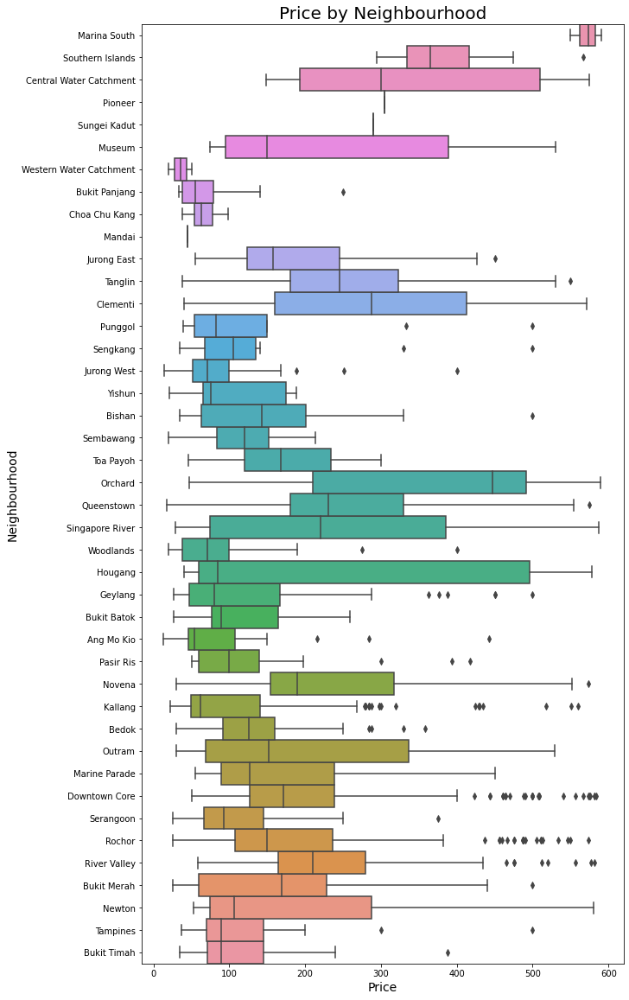

In [93]:
# Boxplot of price by neighbourhood
plt.figure(figsize=(10, 20))
sns.boxplot(x = 'price', y = 'neighbourhood', data = listings, width = 1, orient = 'h')
plt.title('Price by Neighbourhood', fontsize = 20);
plt.xlabel('Price', fontsize = 14)
plt.ylabel('Neighbourhood', fontsize = 14)

From the box plot, it can be seen that listings in Marina South tend to fetch the highest price with a short price range as compared to other neighbourhoods.

We can also visualise information pertaining to the neighbourhood by plotting a map of the neighbourhoods in Singapore. We will utilise the Geopandas and Folium libraries to do so.

In [96]:
import geopandas as gpd

In [97]:
# Read the Neighbourhood geoJSON file using geopandas
geojson = gpd.read_file('./data/neighbourhoods.geojson')

In [98]:
geojson.head()

,neighbourhood,neighbourhood_group,geometry
0,Pasir Ris,East Region,"MULTIPOLYGON (((103.95322 1.38201, 103.95350 1..."
1,Seletar,North-East Region,"MULTIPOLYGON (((103.88691 1.42649, 103.88812 1..."
2,Sungei Kadut,North Region,"MULTIPOLYGON (((103.76440 1.44345, 103.76443 1..."
3,Orchard,Central Region,"MULTIPOLYGON (((103.84298 1.30001, 103.84294 1..."
4,Simpang,North Region,"MULTIPOLYGON (((103.86350 1.43433, 103.86361 1..."


In [99]:
# Group listings by neighbourhood and count the number of listings and median price
listings_count = listings.groupby('neighbourhood')['id'].count().reset_index()
# Rename columns from id to count
listings_count.rename(columns = {'id': 'count'}, inplace = True)

In [100]:
listings_count = listings.groupby(
    ["neighbourhood"],
    as_index = False
).agg(median_price = ("price","median"),
    count = ("price","count")
).sort_values(by = 'median_price', ascending = False
).reset_index(drop = True)

In [101]:
listings_count.head()

,neighbourhood,median_price,count
0,Marina South,573.0,4
1,Orchard,447.0,45
2,Southern Islands,365.0,12
3,Pioneer,305.0,1
4,Central Water Catchment,300.0,5


In [102]:
# Merge the listings_count with the geojson
listings_map = geojson.merge(listings_count, left_on = 'neighbourhood', right_on = 'neighbourhood', how = 'outer')

In [103]:
listings_map.isnull().sum()

neighbourhood           0
neighbourhood_group     0
geometry                0
median_price           13
count                  13
dtype: int64

In [104]:
# Fill the null values with 0
listings_map.fillna(0, inplace = True)

We will create a map using Folium showing the number of listings and median price of listings in each neighbourhood.

In [105]:
# Create Singapore map and FeatureGroup Layers
sg_map = folium.Map([1.3521, 103.8198], zoom_start = 11.5, overlay = False)
fg1 = folium.FeatureGroup(name = 'Count of Airbnb listings for Neighbourhoods', overlay = False).add_to(sg_map)
fg2 = folium.FeatureGroup(name = 'Median Price of Airbnb listings for Neighbourhoods', overlay = False).add_to(sg_map)

In [106]:
# Add the first choro map to fg1 (Airbnb listings count)
custom_scale1 = listings_map['count'].quantile((0,0.2,0.4,0.6,0.8,1)).tolist()

listings_count = folium.Choropleth(
    geo_data = r'./data/neighbourhoods.geojson',
    data = listings_map,
    columns = ['neighbourhood','count'], # Here we tell folium to get neighbourhood and count from our listings_map dataframe
    key_on='feature.properties.neighbourhood', # Here we tell folium to get the neighbourhood from the geojson file
    threshold_scale = custom_scale1, # Use the scale that we have created for legend
    fill_color='YlOrRd',
    nan_fill_color="White", #Use white color if there is no data available for the county
    fill_opacity=0.7,
    ine_opacity=0.2,
    legend_name='Count of Airbnb listings for Neighbourhoods', #title of the legend
    highlight=True,
    Overlay = False,
    line_color='black').geojson.add_to(fg1) # Add the choropleth map to our base map

# Add customised tooltips to the map
folium.features.GeoJson(
    data = listings_map,
    name = 'Count of Airbnb listings for Neighbourhoods',
    smooth_factor = 2,
    style_function = lambda x: {'color':'black', 'fillColor':'transparent','weight':0.5},
    tooltip = folium.features.GeoJsonTooltip(
        fields = ['neighbourhood', 'neighbourhood_group','count'],
        aliases = ['Neighbourhood: ', 'Neighbourhood Group: ', 'Count: '],
        localize = True,
        sticky = False,
        labels = True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,),
            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
        ).add_to(listings_count)

In [107]:
# Add the second choro map to fg2 (Median listings of neighbourhoods)
custom_scale2 = listings_map['median_price'].quantile((0,0.2,0.4,0.6,0.8,1)).tolist()

listings_median = folium.Choropleth(
    geo_data = r'./data/neighbourhoods.geojson',
    data = listings_map,
    columns = ['neighbourhood','median_price'], # Here we tell folium to get neighbourhood and count from our listings_map dataframe
    key_on='feature.properties.neighbourhood', # Here we tell folium to get the neighbourhood from the geojson file
    threshold_scale = custom_scale2, # Use the scale that we have created for legend
    fill_color='YlOrRd',
    nan_fill_color="White", #Use white color if there is no data available for the county
    fill_opacity=0.7,
    ine_opacity=0.2,
    legend_name='Count of Airbnb listings for Neighbourhoods', #title of the legend
    highlight=True,
    Overlay = False,
    line_color='black').geojson.add_to(fg2) # Add the choropleth map to our base map

# Add customised tooltips to the map
folium.features.GeoJson(
    data = listings_map,
    name = 'Median price of Airbnb listings for Neighbourhoods',
    smooth_factor = 2,
    style_function = lambda x: {'color':'black', 'fillColor':'transparent','weight':0.5},
    tooltip = folium.features.GeoJsonTooltip(
        fields = ['neighbourhood', 'neighbourhood_group','median_price'],
        aliases = ['Neighbourhood: ', 'Neighbourhood Group: ', 'Median Price: '],
        localize = True,
        sticky = False,
        labels = True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,),
            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
        ).add_to(listings_median)

In [108]:
# Add the layer control
folium.TileLayer('cartodbdark_matter', overlay = True, name = "View in dark mode").add_to(sg_map)
folium.TileLayer('cartodbpositron', overlay = True, name = "View in light mode").add_to(sg_map)
folium.LayerControl(collapsed = False).add_to(sg_map)

# # Show the map
sg_map

##### Neighbourhood group

We can also investigate the relationship between the neighbourhood group and the price of the listing. \

In [109]:
listings.groupby(
    ["neighbourhood_group_cleansed"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,neighbourhood_group_cleansed,avg_price,qty
0,Central Region,189.237043,2354
1,West Region,168.588517,209
2,North-East Region,148.406250,96
3,East Region,127.487500,160
4,North Region,120.268293,82


Text(0.5, 1.0, 'Price of Airbnb listings in each Neighbourhood Group')

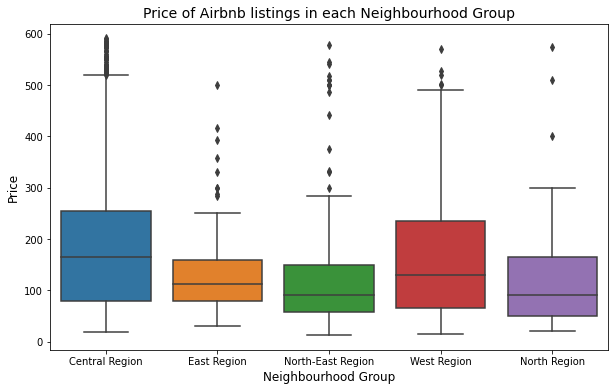

In [110]:
# Plot the box plot for the Price of listings in each neighbourhood group
plt.figure(figsize = (10,6))
sns.boxplot(x = 'neighbourhood_group_cleansed', y = 'price', data = listings)
plt.xlabel('Neighbourhood Group', fontsize = 12)
plt.ylabel('Price', fontsize = 12)
plt.title('Price of Airbnb listings in each Neighbourhood Group', fontsize = 14)

#### Property details

Airbnb homeowners will also provide the type of property and room that they are renting out. \
We will investigate how these details can affect the price of the listing.

#### Room type

In [111]:
listings.groupby(
    ["room_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,room_type,avg_price,qty
0,Entire home/apt,258.385827,1270
1,Hotel room,156.697674,129
2,Private room,120.604467,1388
3,Shared room,82.833333,114


Text(0.5, 1.0, 'Price of Airbnb listings by Room Type')

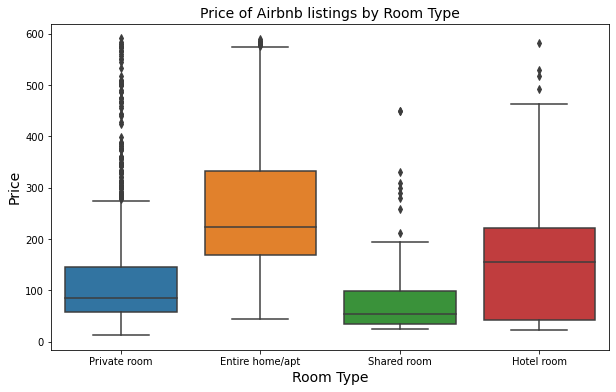

In [112]:
# Plot the box plot for the Price of listings by Room type
plt.figure(figsize = (10,6))
sns.boxplot(x = 'room_type', y = 'price', data = listings)
plt.xlabel('Room Type', fontsize = 14)
plt.ylabel('Price', fontsize = 14)
plt.title('Price of Airbnb listings by Room Type', fontsize = 14)

As expected, the listing price of an entire home is generally higher than those of the Private, shared and Hotel rooms.

Another observation is that for private room, there are many listings above the upper whisker limit (Q3 + 1.5*IQR). This signifies that there are many outliers in the price range for the particular property type.


#### Property type

We will investigate the relationship between the property type and the price of the listing.

In [113]:
# Let us check out the average price and number of listings for each property type
listings.groupby(
    ["property_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,property_type,avg_price,qty
0,Private room in rental unit,76.316695,581
1,Entire condo,243.886792,477
2,Entire serviced apartment,286.451087,368
3,Entire rental unit,259.879518,332
4,Private room in condo,99.471074,242
5,Private room in home,96.433566,143
6,Room in boutique hotel,251.044118,136
7,Room in hotel,276.431818,88
8,Room in hostel,66.328125,64
9,Private room in townhouse,100.300000,50


As the property type is manually set by the homeowners, there are no fixed categories for the property type. Hence, we will group the property type into 3 categories: House, Apartment and Hotel.

In [114]:
# For House
listings.loc[listings['property_type'].str.contains('bungalow|villa|boat|casa|townhouse', case = False), 'property_type'] = 'House'
# For Hotel
listings.loc[listings['property_type'].str.contains('hotel|hostel|breakfast|aparthotel|campsite|container|resort|tent', case = False), 'property_type'] = 'Hotel'
# For apartment
listings.loc[listings['property_type'].str.contains('condo|unit|loft|home|apartment|guesthouse|suite|home|riad|room|place', case = False), 'property_type'] = 'Apartment'

In [115]:
listings.groupby(
    ["property_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,property_type,avg_price,qty
0,Apartment,181.190823,2332
1,Hotel,188.530303,462
2,House,145.495327,107


To plot a visual chart of the percentage of listings in each category, we will utilise the PyWaffle library.

In [116]:
from pywaffle import Waffle

In [117]:
listings_propertytype = dict(listings['property_type'].value_counts()/len(listings)* 100)

In [118]:
listings_propertytype

{'Apartment': 80.38607376766632,
 'Hotel': 15.92554291623578,
 'House': 3.688383316097897}

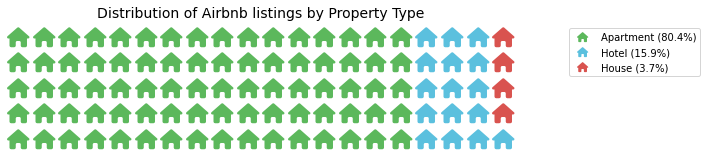

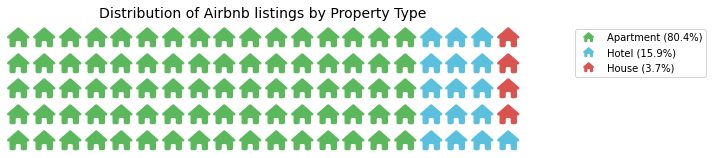

In [119]:
plt.figure(figsize = (10,6),
    FigureClass = Waffle,
    rows = 5,
    values = listings_propertytype,
    labels = [f"{k} ({v:0.1f}%)" for k, v in listings_propertytype.items()],
    legend = {'loc': 'upper left', 'bbox_to_anchor': (1.1, 1)},
    colors = ("#5cb85c", "#5bc0de", "#d9534f"),
    title = {'label': 'Distribution of Airbnb listings by Property Type', 'loc': 'center', 'fontsize': 14},
    icons = 'home', icon_size = 20, icon_legend = True
)

We can also create a box plot to see the distribution of price for each property type.

Text(0.5, 1.0, 'Price of Airbnb listings by Property type')

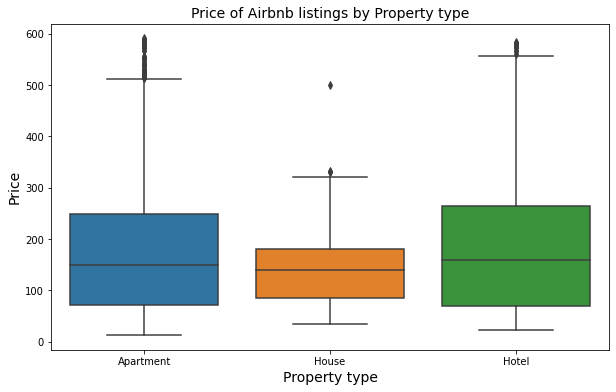

In [120]:
# Plot the box plot for the Price of listings in each neighbourhood group
plt.figure(figsize = (10,6))
sns.boxplot(x = 'property_type', y = 'price', data = listings)
plt.xlabel('Property type', fontsize = 14)
plt.ylabel('Price', fontsize = 14)
plt.title('Price of Airbnb listings by Property type', fontsize = 14)

We can also view the location of the different listings on the Map and also the price of the listings and the property type.

In [121]:
# Let us plot the property type on Folium
# Create a base map
sg_map = folium.Map(location = [1.3521, 103.8198], zoom_start = 11, tiles = 'cartodbdark_matter')

In [122]:
# Plot the property type on the map
coord_list = listings[["latitude", "longitude"]].values.tolist()
price_series = listings['price'].reset_index(drop=True)

color = listings['property_type'].map({'Condominium':'red', 'Apartment':'blue', 'Hotel':'green', 'Hostel':'orange', 'Home':'purple', 'House':'pink', 'Others':'grey'})

for listing in range(0, len(coord_list)):
    folium.CircleMarker(coord_list[listing], popup = price_series[listing], color = color[listing], radius =1).add_to(sg_map)

#sg_map

In [123]:
from branca.element import Template, MacroElement

In [124]:
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:blue;opacity:0.7;'></span>Apartment</li>
    <li><span style='background:green;opacity:0.7;'></span>Hotel</li>
    <li><span style='background:pink;opacity:0.7;'></span>House</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

sg_map.get_root().add_child(macro)

sg_map

It can be seen that more than 80% of listings are located at Central region with Apartments spread throughout the island while Houses are sporadic around the island. \
Hotel listings are centered around the CBD and Southern Waterfront area.

##### Accommodations, Bedrooms and beds

Similarly to the housing market, the number of bedrooms and beds in a listing will affect the price of the listing. \
We will investigate the relationship between the number of bedrooms and beds and the price of the listing.

In [125]:
listings.groupby(
    ["bedrooms"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,bedrooms,avg_price,qty
0,1.0,154.607552,2357
1,2.0,279.983425,362
2,3.0,328.024845,161
3,4.0,323.833333,18
4,5.0,267.000000,3


Text(0, 0.5, 'Median price ($)')

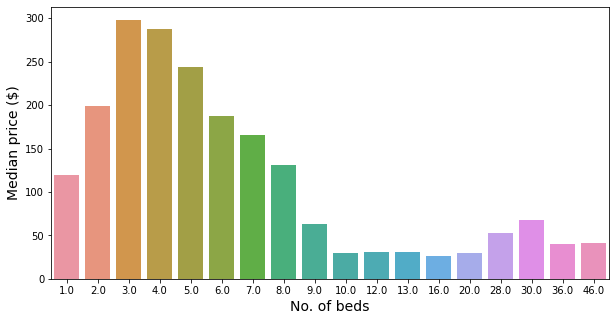

In [126]:
# Create bar plot of median price by beds
plt.figure(figsize = (10,5))
sns.barplot(data = listings, x = 'beds', y = 'price', estimator = np.median, ci = None)
plt.xlabel('No. of beds', fontsize = 14)
plt.ylabel('Median price ($)', fontsize = 14)

Text(0, 0.5, 'Median price ($)')

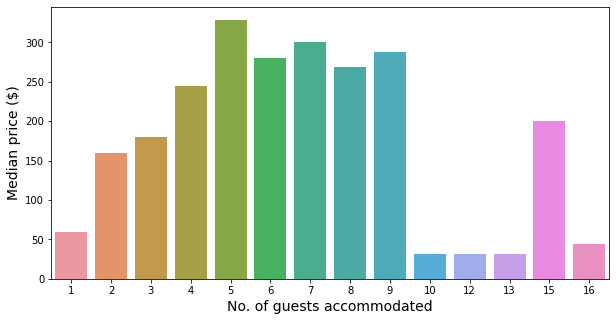

In [127]:
# Create bar plot of median price by accommodates
plt.figure(figsize = (10,5))
sns.barplot(data = listings, x = 'accommodates', y = 'price', estimator = np.median, ci = None)
plt.xlabel('No. of guests accommodated', fontsize = 14)
plt.ylabel('Median price ($)', fontsize = 14)

 Median prices generally increased with no. of guests
 
In general, listings with high no. of bedrooms and accommodation capacity (e.g. 12 and 16) are hostels which provides a cheap living for Airbnb users in Singapore.

Text(0, 0.5, 'Median price ($)')

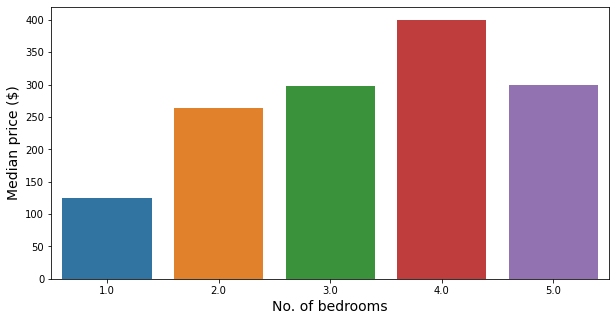

In [128]:
# Create bar plot of median price by accommodates
plt.figure(figsize = (10,5))
sns.barplot(data = listings, x = 'bedrooms', y = 'price', estimator = np.median, ci = None)
plt.xlabel('No. of bedrooms', fontsize = 14)
plt.ylabel('Median price ($)', fontsize = 14)

The prices of Airbnb listings go up with the no. of bedrooms with the price of a 2 bedder being almost double that of a 1 bedder while a 5 room listing is cheaper than a 4 bedder.

Text(0.5, 1.0, 'No. of listings by Beds')

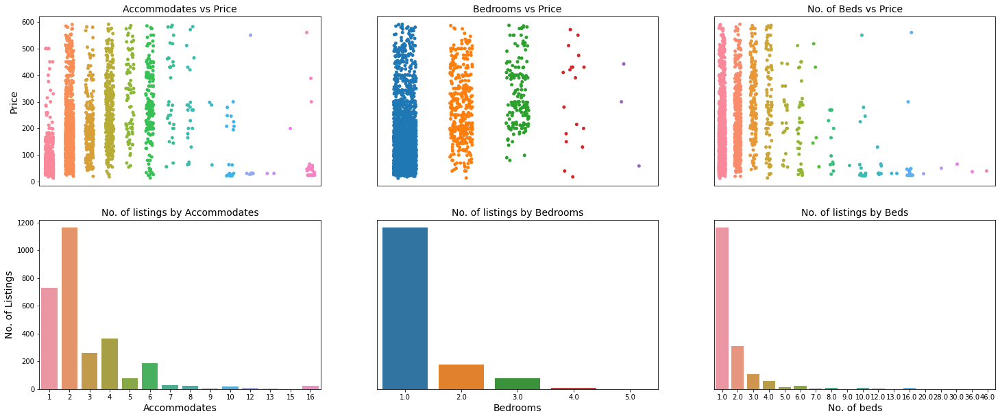

In [421]:
# Let us look at how the listings prices affected by the number of bedrooms and beds

fig, axes = plt.subplots(2,3, figsize = (25,10))

# Accomodates vs Price
sns.stripplot(data = listings, x = 'accommodates', y = 'price', ax = axes[0,0], jitter = 0.2)
axes[0,0].get_xaxis().set_visible(False)
axes[0,0].set_ylabel('Price', fontsize = 14)
axes[0,0].set_title('Accommodates vs Price', fontsize = 14)
# Bedrooms vs Price
sns.stripplot(data = listings, x = 'bedrooms', y = 'price', ax = axes[0,1], jitter = 0.2)
axes[0,1].get_xaxis().set_visible(False)
axes[0,1].get_yaxis().set_visible(False)
axes[0,1].set_title('Bedrooms vs Price', fontsize = 14)
# Beds vs Price
sns.stripplot(data = listings, x = 'beds', y = 'price', ax = axes[0,2], jitter = 0.2)
axes[0,2].get_xaxis().set_visible(False)
axes[0,2].get_yaxis().set_visible(False)
axes[0,2].set_title('No. of Beds vs Price', fontsize = 14)

# Accomodates vs Count
sns.countplot(data = listings, x = 'accommodates', ax = axes[1,0])
axes[1,0].set_xlabel('Accommodates', fontsize = 14)
axes[1,0].set_ylabel('No. of Listings', fontsize = 14)
axes[1,0].set_title('No. of listings by Accommodates', fontsize = 14)

# Bedrooms vs Count
sns.countplot(data = listings, x = 'bedrooms', ax = axes[1,1])
axes[1,1].set_xlabel('Bedrooms', fontsize = 14)
axes[1,1].get_yaxis().set_visible(False)
axes[1,1].set_title('No. of listings by Bedrooms', fontsize = 14)

# Beds vs Count
sns.countplot(data = listings, x = 'beds', ax = axes[1,2])
axes[1,2].set_xlabel('No. of beds', fontsize = 14)
axes[1,2].get_yaxis().set_visible(False)
axes[1,2].set_title('No. of listings by Beds', fontsize = 14)

#### Amenities

In [427]:
# It seems that the amenities column is a list of amenities provided by the host
listings['amenities']

0       ["Gym", "Washer", "Kitchen", "TV with standard...
1       ["Children\u2019s books and toys", "Iron", "Ke...
2       ["Children\u2019s books and toys", "Iron", "Pa...
3       ["Private patio or balcony", "Iron", "Air cond...
4       ["Hot water", "Washer", "Kitchen", "Smart lock...
5       ["Hot water", "Washer", "Kitchen", "Smart lock...
6       ["Iron", "Washer", "Kitchen", "Elevator", "Sma...
7       ["Children\u2019s books and toys", "Iron", "Ke...
8       ["Iron", "Air conditioning", "Smoke alarm", "H...
9       ["Iron", "TV with standard cable", "Air condit...
10      ["Backyard", "Iron", "Washer", "Kitchen", "Ele...
11      ["Washer", "Kitchen", "Air conditioning", "TV"...
12      ["Iron", "Air conditioning", "Hangers", "Essen...
13      ["Gym", "Washer", "Kitchen", "Pool", "Air cond...
14      ["Iron", "Washer", "Kitchen", "Hair dryer", "A...
15      ["Iron", "Washer", "Kitchen", "Elevator", "Loc...
16      ["Iron", "Paid parking on premises", "TV with ...
17      ["Iron

In [428]:
# # We will have to clean the amenities column by removing the brackets and the quotation marks
listings['amenities'] = listings['amenities'].str.replace('[', '')
listings['amenities'] = listings['amenities'].str.replace(']', '')
listings['amenities'] = listings['amenities'].str.replace('"', '')  

<ipython-input-428-0b7268076ffb>:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.

<ipython-input-428-0b7268076ffb>:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.



In [429]:
listings['amenities']

0       Gym, Washer, Kitchen, TV with standard cable, ...
1       Children\u2019s books and toys, Iron, Keypad, ...
2       Children\u2019s books and toys, Iron, Paid par...
3       Private patio or balcony, Iron, Air conditioni...
4       Hot water, Washer, Kitchen, Smart lock, Hair d...
5       Hot water, Washer, Kitchen, Smart lock, Lock o...
6       Iron, Washer, Kitchen, Elevator, Smart lock, S...
7       Children\u2019s books and toys, Iron, Keypad, ...
8       Iron, Air conditioning, Smoke alarm, Hangers, ...
9       Iron, TV with standard cable, Air conditioning...
10      Backyard, Iron, Washer, Kitchen, Elevator, Loc...
11      Washer, Kitchen, Air conditioning, TV, Long te...
12      Iron, Air conditioning, Hangers, Essentials, D...
13      Gym, Washer, Kitchen, Pool, Air conditioning, ...
14      Iron, Washer, Kitchen, Hair dryer, Air conditi...
15      Iron, Washer, Kitchen, Elevator, Lock on bedro...
16      Iron, Paid parking on premises, TV with standa...
17      Iron, 

In [135]:
# Create a dictionary to store the amenities and their counts

amenities = listings['amenities']

amenities_dict = {}

# Loop through the amenities column and count the number of times each amenity appears
for i in amenities:
    for j in i.split(','):
        if j in amenities_dict:
            amenities_dict[j] += 1
        else:
            amenities_dict[j] = 1

In [136]:
amenities_dict

{'["Gym"': 53,
 ' "Washer"': 2132,
 ' "Kitchen"': 2234,
 ' "TV with standard cable"': 517,
 ' "Cable TV"': 537,
 ' "Pool"': 1207,
 ' "Air conditioning"': 2650,
 ' "Long term stays allowed"': 2859,
 ' "Wifi"': 2740,
 ' "Elevator"': 1307,
 ' "Essentials"': 2323,
 ' "Shampoo"]': 679,
 '["Children\\u2019s books and toys"': 31,
 ' "Iron"': 604,
 ' "Keypad"': 337,
 ' "Fire pit"': 13,
 ' "Smoke alarm"': 1450,
 ' "Hangers"': 2188,
 ' "Dryer"': 1149,
 ' "Hot water"': 1481,
 ' "Hair dryer"': 1883,
 ' "Cooking basics"': 1253,
 ' "Fire extinguisher"': 1349,
 ' "Outdoor furniture"': 136,
 ' "Refrigerator"': 1582,
 ' "Outdoor dining area"': 155,
 ' "Shared hot tub"': 34,
 ' "Luggage dropoff allowed"': 874,
 ' "BBQ grill"': 326,
 ' "Free street parking"': 354,
 ' "Free parking on premises"': 761,
 ' "Private fenced garden or backyard"': 13,
 ' "Lock on bedroom door"': 1053,
 ' "TV"': 1524,
 ' "Dedicated workspace"': 495,
 ' "Shampoo"': 907,
 ' "Private entrance"]': 846,
 ' "Paid parking on premises"'

In [137]:
# Create a dataframe from the dictionary
amenities_df = pd.DataFrame.from_dict(amenities_dict, orient = 'index', columns = ['count']).sort_values(by = 'count', ascending = False).reset_index()
amenities_df.rename(columns = {'index': 'amenities'}, inplace = True)

# Create a Percentage column to show the percentage of listings that have the amenity
amenities_df['percentage of listing'] = round(amenities_df['count']/len(listings)*100, 2)

<AxesSubplot:xlabel='count', ylabel='amenities'>

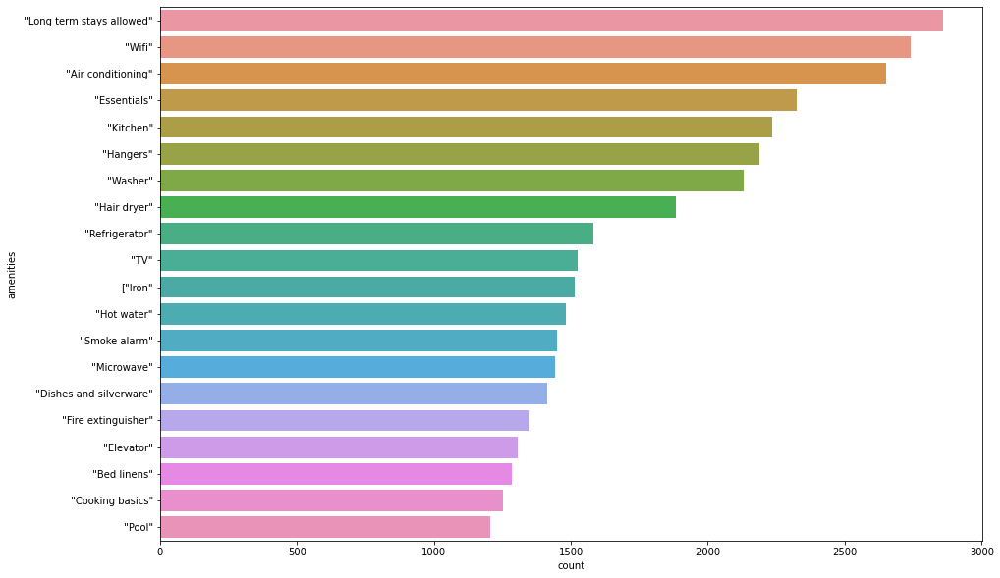

In [138]:
# Let us look at the top 20 amenities
fig, ax = plt.subplots(figsize = (15,10))
sns.barplot(data = amenities_df.head(20), y = 'amenities', x = 'count', ax = ax)

#### Continuous variables

We will plot the distribution of the continuous variables using a histogram

In [139]:
# Let us get the continuous variables
continuous_col = listings.select_dtypes(include = ['float64', 'int64']).columns

In [140]:
# Drop the id columns
continuous_col = continuous_col.drop(['id', 'host_id'])

In [141]:
continuous_df = listings[continuous_col]

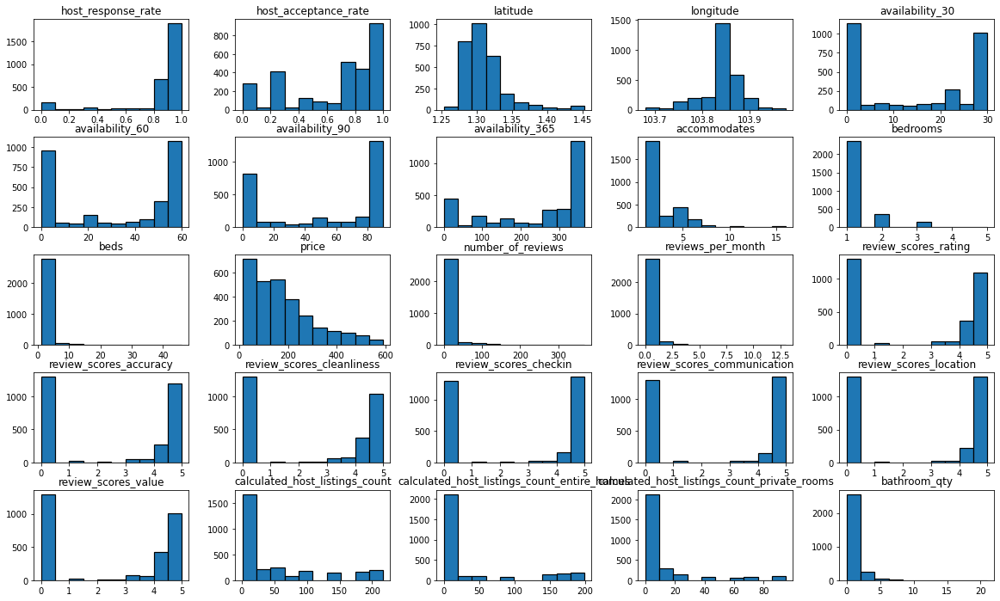

In [143]:
listings[continuous_col].hist(grid = False, figsize = (20,12), edgecolor = 'black', linewidth = 1.2);

#### Save the cleaned data

In [144]:
#### Save cleaned listing data to pickle file
listings.to_pickle('./data/listings_cleaned.pkl')